# Comprehensive WSI (Whole Slide Imaging) Processing Tutorial

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/lab-rasool/HoneyBee/blob/main/examples/mayo/03_wsi_preprocessing.ipynb)

This notebook provides a detailed walkthrough of working with Whole Slide Images (WSI) using HoneyBee's advanced processing capabilities. We'll cover:

1. **WSI Loading Basics** - Understanding multi-resolution pyramids and efficient data access
2. **Tissue Detection** - Classical and deep learning approaches for identifying tissue regions
3. **Stain Normalization** - Reducing color variations across slides for consistent analysis
4. **Stain Separation** - Analyzing individual stain components (H&E) for quantitative analysis

## Prerequisites

- HoneyBee framework installed
- OpenSlide system dependency
- CUDA-capable GPU (optional but recommended)
- Sample WSI file (e.g., TCGA slide in .svs format)

In [140]:
# Environment detection and setup
import sys
import os
from pathlib import Path

# Check if running in Google Colab
try:
    import google.colab
    IN_COLAB = True
    print("🌐 Running in Google Colab")
    
    # Setup Colab-specific environment
    !apt-get update -qq
    !apt-get install -y openslide-tools > /dev/null 2>&1
    print("✓ Installed openslide-tools")
    
    # Clone HoneyBee repository if not already present
    if not os.path.exists('/content/HoneyBee'):
        print("📥 Cloning HoneyBee repository...")
        !git clone https://github.com/lab-rasool/HoneyBee.git /content/HoneyBee > /dev/null 2>&1
        print("✓ HoneyBee repository cloned")
    
    # Add to Python path
    sys.path.insert(0, '/content/HoneyBee')
    
    # Install dependencies
    print("📦 Installing dependencies...")
    # Install Python dependencies
    !curl -LsSf https://astral.sh/uv/install.sh | sh
    !uv pip install -r /content/HoneyBee/requirements.txt
    !uv pip install openslide-python scikit-image matplotlib numpy pillow torch torchvision transformers accelerate
    print("✓ Dependencies installed")
    
    # Set up directories
    SAMPLE_DIR = Path("/content/sample_data")
    OUTPUT_DIR = Path("/content/outputs")
    MODEL_DIR = Path("/content/models")
    
    # Create directories
    for dir_path in [SAMPLE_DIR, OUTPUT_DIR, MODEL_DIR]:
        dir_path.mkdir(exist_ok=True)
    
    print(f"📁 Directories created:")
    print(f"   Sample data: {SAMPLE_DIR}")
    print(f"   Outputs: {OUTPUT_DIR}")
    print(f"   Models: {MODEL_DIR}")
    
except ImportError:
    IN_COLAB = False
    print("💻 Running locally")
    
    # Add HoneyBee to path for local environment
    honeybee_path = Path().absolute().parent.parent
    if str(honeybee_path) not in sys.path:
        sys.path.insert(0, str(honeybee_path))
    
    # Local directories
    SAMPLE_DIR = Path("../samples")
    OUTPUT_DIR = Path("./wsi_tutorial_outputs")
    MODEL_DIR = Path.home() / "Models"
    
print(f"\nPython path configured: {sys.path[0]}")

💻 Running locally

Python path configured: /mnt/f/Projects/HoneyBee


In [141]:
# Configuration - Update these paths for your environment
if IN_COLAB:
    # Colab paths
    WSI_PATH = SAMPLE_DIR / "sample.svs"  # Will be set up in next cell
    TISSUE_DETECTOR_PATH = MODEL_DIR / "TissueDetector" / "HnE.pt"
    
    # Create subdirectories
    (MODEL_DIR / "TissueDetector").mkdir(exist_ok=True, parents=True)
    
else:
    # Local paths
    WSI_PATH = "/mnt/f/Projects/HoneyBee/examples/samples/sample.svs"  # Update this
    TISSUE_DETECTOR_PATH = "/mnt/d/Models/TissueDetector/HnE.pt"  # Update this

# Ensure output directory exists
OUTPUT_DIR.mkdir(exist_ok=True)
print(f"Output directory: {OUTPUT_DIR}")

# Check if files exist
if not os.path.exists(WSI_PATH):
    print(f"⚠️ Warning: WSI file not found at {WSI_PATH}")
    print("Please update WSI_PATH or upload a WSI file.")
else:
    print(f"✓ WSI file found: {WSI_PATH}")
    
if not os.path.exists(TISSUE_DETECTOR_PATH):
    print(f"⚠️ Warning: Tissue detector model not found at {TISSUE_DETECTOR_PATH}")
    print("Deep learning tissue detection will not be available.")
else:
    print(f"✓ Tissue detector model found: {TISSUE_DETECTOR_PATH}")

Output directory: wsi_tutorial_outputs
✓ WSI file found: /mnt/f/Projects/HoneyBee/examples/samples/sample.svs
✓ Tissue detector model found: /mnt/d/Models/TissueDetector/HnE.pt


In [142]:
# Sample Data Setup for Colab
if IN_COLAB:
    print("📁 Setting up sample WSI data for Colab...")
    
    # Option 1: Check if sample exists in cloned repo
    repo_sample_path = Path("/content/HoneyBee/examples/samples/sample.svs")
    if repo_sample_path.exists():
        # Copy to our sample directory
        import shutil
        shutil.copy(repo_sample_path, WSI_PATH)
        print(f"✅ Copied sample WSI from repository")
        print(f"   Size: {os.path.getsize(WSI_PATH) / (1024**2):.1f} MB")
    else:
        print("⚠️ Sample WSI not found in repository")
        print("\n📤 Option 1: Upload your own WSI file")
        print("You can upload a .svs file using the file browser on the left")
        print("or by uncommenting and running the upload code below:")
        print("\n# from google.colab import files")
        print("# uploaded = files.upload()")
        print("# if uploaded:")
        print("#     for filename, content in uploaded.items():")
        print("#         if filename.endswith('.svs'):")
        print("#             with open(SAMPLE_DIR / filename, 'wb') as f:")
        print("#                 f.write(content)")
        print("#             WSI_PATH = SAMPLE_DIR / filename")
        print("#             print(f'✅ Uploaded: {filename}')")
        
        print("\n📥 Option 2: Download a public TCGA sample")
        print("Uncomment and run the code below to download a sample:")
        print("\n# !wget -q -O {WSI_PATH} 'https://example.com/sample.svs'")
        
    # Download tissue detector model if not present
    if not TISSUE_DETECTOR_PATH.exists():
        print("\n📥 Downloading tissue detector model...")
        # Note: Replace with actual model download URL if available
        print("⚠️ Tissue detector model download not configured")
        print("Deep learning tissue detection will use classical methods as fallback")
        
else:
    # Local environment - just show the current paths
    print(f"Using local WSI file: {WSI_PATH}")
    print(f"Using local tissue detector: {TISSUE_DETECTOR_PATH}")

Using local WSI file: /mnt/f/Projects/HoneyBee/examples/samples/sample.svs
Using local tissue detector: /mnt/d/Models/TissueDetector/HnE.pt


In [143]:
# Setup and imports - Using HoneyBee exclusively
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import time

# Add HoneyBee to path if needed
honeybee_path = os.path.abspath(os.path.join(os.getcwd(), '../..'))
if honeybee_path not in sys.path:
    sys.path.append(honeybee_path)

# HoneyBee imports for all functionality
from honeybee.loaders.Slide.slide import Slide
from honeybee.models.TissueDetector.tissue_detector import TissueDetector
from honeybee.processors.wsi import (
    ReinhardNormalizer, MacenkoNormalizer, VahadaneNormalizer,
    ColorAugmenter, StainSeparator, ClassicalTissueDetector,
    detect_tissue, separate_stains, visualize_stains
)

# Embedding models
from honeybee.models.UNI.uni import UNI
from honeybee.models.UNI2.uni2 import UNI2
from honeybee.models.Virchow2.virchow2 import Virchow2

plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100

print("HoneyBee WSI Tutorial Environment Loaded")
print(f"NumPy version: {np.__version__}")
print(f"Working directory: {os.getcwd()}")
print("\nAvailable HoneyBee modules:")
print("- Slide loading and visualization")
print("- Classical tissue detection") 
print("- Deep learning tissue detection")
print("- Stain normalization (Reinhard, Macenko)")
print("- Stain separation")
print("- Embedding generation (UNI, UNI2, Virchow2)")

HoneyBee WSI Tutorial Environment Loaded
NumPy version: 1.26.4
Working directory: /mnt/f/Projects/HoneyBee/examples/mayo

Available HoneyBee modules:
- Slide loading and visualization
- Classical tissue detection
- Deep learning tissue detection
- Stain normalization (Reinhard, Macenko)
- Stain separation
- Embedding generation (UNI, UNI2, Virchow2)


In [144]:
# Load WSI with basic settings
if not os.path.exists(WSI_PATH):
    print("❌ WSI file not found!")
    print(f"Expected location: {WSI_PATH}")
    print("\nPlease either:")
    print("1. Upload a WSI file (.svs format)")
    print("2. Update the WSI_PATH variable")
    print("3. Download a sample WSI file")
    
    # Create a dummy slide for demonstration if no WSI available
    if IN_COLAB:
        print("\n⚠️ Creating synthetic data for demonstration...")
        # Skip the rest of the notebook or use synthetic data
        raise RuntimeError("WSI file not found. Please upload a WSI file to continue.")
else:
    print("Loading WSI...")
    start_time = time.time()

    slide = Slide(
        str(WSI_PATH),  # Convert Path to string
        visualize=False,  # Don't create visualizations during loading
        max_patches=100,  # Limit patches for faster loading
        verbose=True      # Show loading progress
    )

    load_time = time.time() - start_time
    print(f"\nWSI loaded in {load_time:.2f} seconds")

Loading WSI...
Resolutions: {'level_count': 3, 'level_dimensions': ((27965, 25146), (6991, 6286), (1747, 1571)), 'level_downsamples': (1.0, 4.00023078918457, 16.00690269470215), 'level_tile_sizes': ((240, 240), (240, 240), (240, 240))}
Level 0: 54x49 (2646) 	 Resolution: 27965x25146
Level 1: 13x12 (156) 	 Resolution: 6991x6286
Level 2: 3x3 (9) 	 Resolution: 1747x1571
Selected level 2 with dimensions: 1571x1747

WSI loaded in 0.04 seconds


# Part 1: WSI Loading Basics

Whole Slide Images are massive multi-resolution images that can be several gigabytes in size. They are stored as pyramids with multiple resolution levels, allowing efficient access at different magnifications.

- **Multi-resolution pyramid**: Multiple versions of the image at different resolutions
- **Levels**: Each pyramid level represents a different magnification (level 0 = highest resolution)
- **Tiles/Patches**: Small regions that can be loaded independently
- **Memory efficiency**: Only load what you need, when you need it

Loading WSI...
Using existing model weights from /mnt/f/Projects/HoneyBee/honeybee/models/TissueDetector/weights/deep-tissue-detector_densenet_state-dict.pt
Resolutions: {'level_count': 3, 'level_dimensions': ((27965, 25146), (6991, 6286), (1747, 1571)), 'level_downsamples': (1.0, 4.00023078918457, 16.00690269470215), 'level_tile_sizes': ((240, 240), (240, 240), (240, 240))}
Level 0: 54x49 (2646) 	 Resolution: 27965x25146
Level 1: 13x12 (156) 	 Resolution: 6991x6286
Selected level 1 with dimensions: 6286x6991

WSI loaded in 3.84 seconds


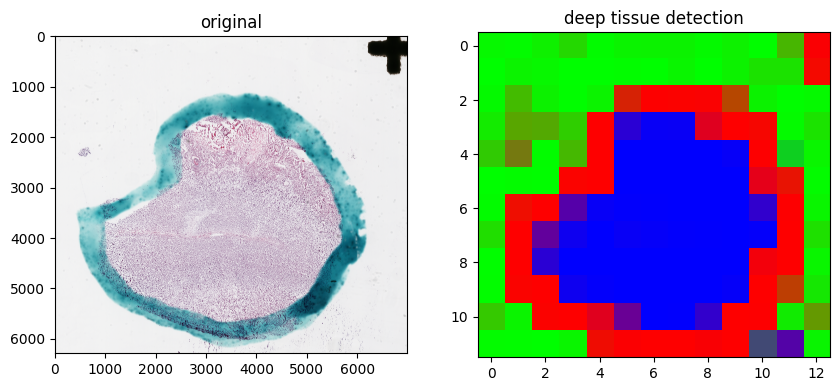

In [148]:
# Load WSI with basic settings
print("Loading WSI...")
start_time = time.time()

slide = Slide(
    WSI_PATH, 
    visualize=True,
    max_patches=500,
    verbose=True,
    tissue_detector=TissueDetector()
)

load_time = time.time() - start_time
print(f"\nWSI loaded in {load_time:.2f} seconds")

In [149]:
# Explore WSI metadata
resolutions = slide.img.resolutions
metadata = slide.img.metadata

print("=== WSI Properties ===")
print(f"Current level dimensions: {slide.slide.width} x {slide.slide.height}")
print(f"Number of pyramid levels: {resolutions['level_count']}")
print(f"\nPyramid structure:")

# Display pyramid levels
for level in range(resolutions['level_count']):
    dims = resolutions['level_dimensions'][level]
    downsample = resolutions['level_downsamples'][level]
    size_mb = (dims[0] * dims[1] * 3) / (1024 * 1024)  # Approximate uncompressed size
    print(f"  Level {level}: {dims[0]:,} x {dims[1]:,} pixels, "
          f"downsample: {downsample:.1f}x, ~{size_mb:.1f} MB uncompressed")

# Vendor-specific metadata
if 'aperio' in metadata:
    aperio = metadata['aperio']
    print(f"\n=== Scanner Information ===")
    print(f"Scanner: {aperio.get('ScanScope ID', 'Unknown')}")
    print(f"Objective magnification: {aperio.get('AppMag', 'Unknown')}x")
    print(f"Microns per pixel: {aperio.get('MPP', 'Unknown')}")
    print(f"Scan date: {aperio.get('Date', 'Unknown')}")

=== WSI Properties ===
Current level dimensions: 6991 x 6286
Number of pyramid levels: 3

Pyramid structure:
  Level 0: 27,965 x 25,146 pixels, downsample: 1.0x, ~2011.9 MB uncompressed
  Level 1: 6,991 x 6,286 pixels, downsample: 4.0x, ~125.7 MB uncompressed
  Level 2: 1,747 x 1,571 pixels, downsample: 16.0x, ~7.9 MB uncompressed

=== Scanner Information ===
Scanner: SS1258
Objective magnification: 20x
Microns per pixel: 0.5001
Scan date: 01/15/08


=== Efficient Region Reading ===
Level 0: Shape=(2000, 2000, 3), Time=0.022s
Level 1: Shape=(2000, 2000, 3), Time=0.058s
Level 2: Shape=(2000, 2000, 3), Time=0.031s


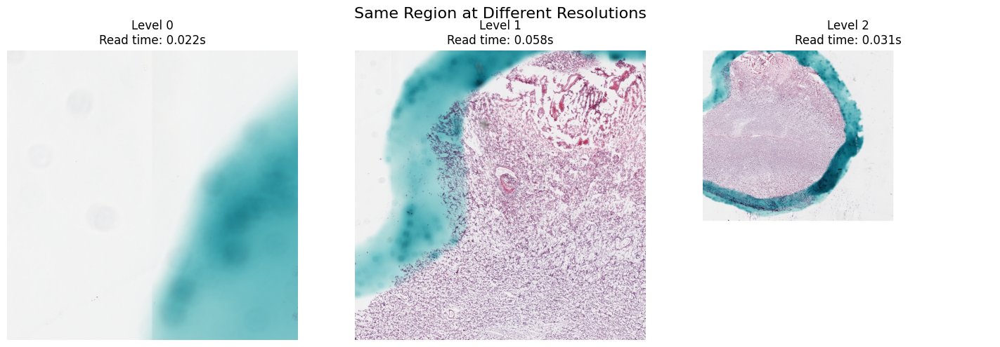

In [150]:
# Demonstrate efficient region reading
print("=== Efficient Region Reading ===")

# Define region of interest
roi_size = (2000, 2000)
level0_dims = resolutions['level_dimensions'][0]
roi_location = (level0_dims[0] // 4, level0_dims[1] // 4)  # Upper-left quadrant

# Read same region at different resolutions
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Same Region at Different Resolutions', fontsize=16)

for i, level in enumerate([0, 1, 2]):
    if level >= resolutions['level_count']:
        continue
        
    start = time.time()
    region = slide.img.read_region(roi_location, roi_size, level)
    read_time = time.time() - start
    
    img_array = np.asarray(region)
    
    axes[i].imshow(img_array)
    axes[i].set_title(f'Level {level}\nRead time: {read_time:.3f}s')
    axes[i].axis('off')
    
    print(f"Level {level}: Shape={img_array.shape}, Time={read_time:.3f}s")

plt.tight_layout()
plt.show()

Generating WSI thumbnail...


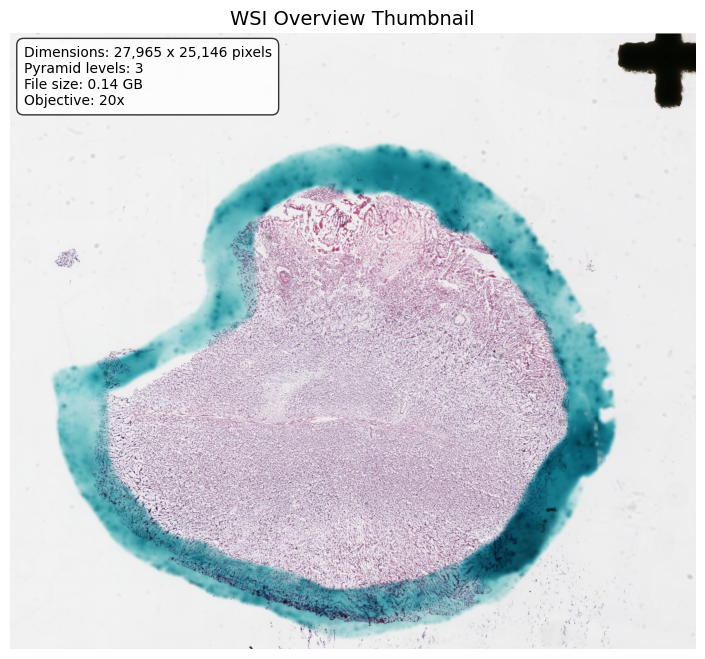

Thumbnail saved to: wsi_tutorial_outputs/wsi_thumbnail.png


In [151]:
# Generate and display thumbnail
print("Generating WSI thumbnail...")

# Use lowest resolution level for thumbnail
last_level = resolutions['level_count'] - 1
last_dims = resolutions['level_dimensions'][last_level]

# Read entire lowest resolution
thumbnail = slide.img.read_region([0, 0], last_dims, last_level)
thumb_array = np.asarray(thumbnail)

# Display with metadata overlay
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(thumb_array)
ax.set_title('WSI Overview Thumbnail', fontsize=14)
ax.axis('off')

# Add metadata text
info_text = f"""Dimensions: {level0_dims[0]:,} x {level0_dims[1]:,} pixels
Pyramid levels: {resolutions['level_count']}
File size: {os.path.getsize(WSI_PATH) / (1024**3):.2f} GB
Objective: {metadata.get('aperio', {}).get('AppMag', 'N/A')}x"""

ax.text(0.02, 0.98, info_text, transform=ax.transAxes, 
        bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8),
        verticalalignment='top', fontsize=10)

plt.show()

# Save thumbnail
thumb_path = os.path.join(OUTPUT_DIR, "wsi_thumbnail.png")
Image.fromarray(thumb_array).save(thumb_path)
print(f"Thumbnail saved to: {thumb_path}")

# Part 2: Tissue Detection

Tissue detection is crucial for WSI analysis as slides contain large areas of background (glass) that don't contain tissue. Efficient tissue detection allows us to:
- Focus computational resources on relevant regions
- Reduce storage and processing requirements
- Improve downstream analysis accuracy

We'll explore two approaches:
1. **Classical Method**: Otsu thresholding with morphological operations
2. **Deep Learning**: Pre-trained CNN for tissue/background/artifact classification

Loading slide without tissue detection...
Using level 2 for tissue detection (1747 x 1571)
Performing classical tissue detection with HoneyBee...
Classical detection completed in 0.64s

Classical Detection Results:
  Tissue ratio: 43.02%
  Tissue pixels: 1,180,811
  Total pixels: 2,744,537
  Number of regions: 11
  Largest region: 1,175,821.0 pixels

Trying different detection methods:
  otsu: 43.8% tissue
  hsv: 46.0% tissue
  gradient: 34.2% tissue
  otsu_hsv: 43.1% tissue

Loading deep learning tissue detector...
Loading slide with deep learning tissue detection...
Resolutions: {'level_count': 3, 'level_dimensions': ((27965, 25146), (6991, 6286), (1747, 1571)), 'level_downsamples': (1.0, 4.00023078918457, 16.00690269470215), 'level_tile_sizes': ((240, 240), (240, 240), (240, 240))}
Level 0: 54x49 (2646) 	 Resolution: 27965x25146
Level 1: 13x12 (156) 	 Resolution: 6991x6286
Selected level 1 with dimensions: 6286x6991

Deep learning detection completed in 1.07s

Deep Learning Detectio

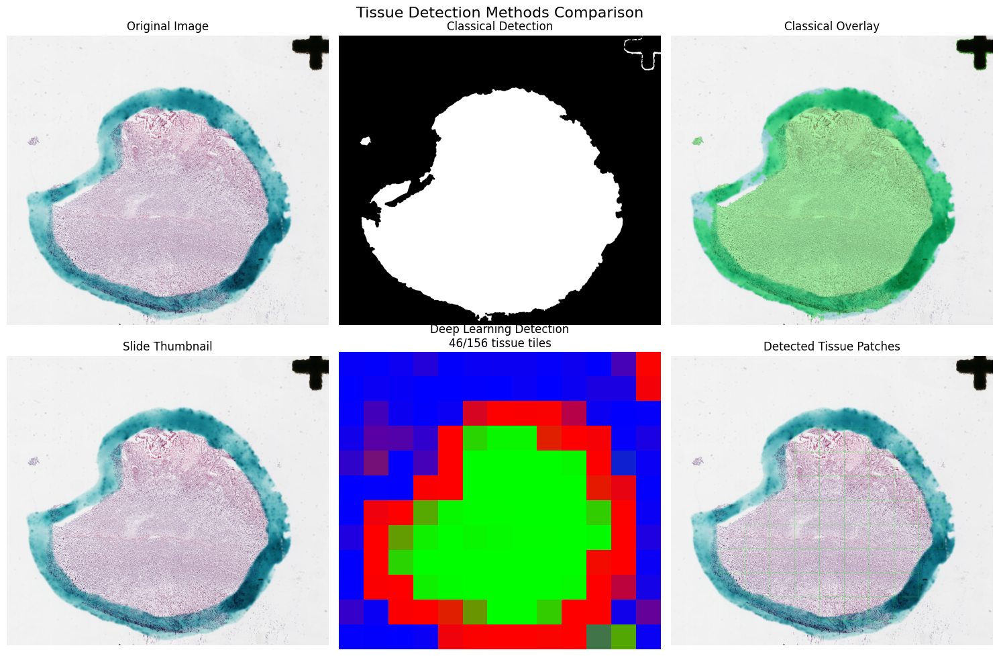


Performance Comparison:
  Classical method: 0.64s
  Deep learning: 1.07s


In [152]:
# Using HoneyBee's classical tissue detection
from honeybee.processors.wsi import ClassicalTissueDetector
import cv2

# Initialize detector with different methods
classical_detector = ClassicalTissueDetector(
    method="otsu_hsv",  # Combined Otsu and HSV for robustness
    min_tissue_size=1000,
    morphology_radius=5
)

# Load a fresh slide for tissue detection comparison
print("Loading slide without tissue detection...")
slide_no_detection = Slide(WSI_PATH, visualize=False, max_patches=1000, verbose=False)

# Get low resolution image for classical detection
detection_level = min(2, resolutions['level_count'] - 1)
level_dims = resolutions['level_dimensions'][detection_level]

print(f"Using level {detection_level} for tissue detection ({level_dims[0]} x {level_dims[1]})")

# Read low resolution image
low_res_image = np.asarray(
    slide_no_detection.img.read_region([0, 0], level_dims, detection_level)
)

# Perform classical tissue detection using HoneyBee
print("Performing classical tissue detection with HoneyBee...")
start_time = time.time()

# Use HoneyBee's classical tissue detector
classical_mask = classical_detector.detect(low_res_image)

classical_time = time.time() - start_time
print(f"Classical detection completed in {classical_time:.2f}s")

# Get tissue statistics using HoneyBee
tissue_stats = classical_detector.get_tissue_stats(low_res_image)

print(f"\nClassical Detection Results:")
print(f"  Tissue ratio: {tissue_stats['tissue_ratio']*100:.2f}%")
print(f"  Tissue pixels: {tissue_stats['tissue_pixels']:,}")
print(f"  Total pixels: {tissue_stats['total_pixels']:,}")
print(f"  Number of regions: {tissue_stats['num_regions']}")
print(f"  Largest region: {tissue_stats['largest_region_area']:,} pixels")

# Try different detection methods
print("\nTrying different detection methods:")
methods = ["otsu", "hsv", "gradient", "otsu_hsv"]
for method in methods:
    detector = ClassicalTissueDetector(method=method, min_tissue_size=100)
    stats = detector.get_tissue_stats(low_res_image)
    print(f"  {method}: {stats['tissue_ratio']*100:.1f}% tissue")

# Load tissue detector model and perform deep learning detection
print("\nLoading deep learning tissue detector...")
tissue_detector = TissueDetector(model_path=TISSUE_DETECTOR_PATH)

# Load slide with tissue detection
print("Loading slide with deep learning tissue detection...")
start_time = time.time()

slide_with_detection = Slide(
    WSI_PATH, 
    visualize=False, 
    tile_size=512,
    max_patches=1000,
    tissue_detector=tissue_detector,
    verbose=True
)

deep_time = time.time() - start_time
print(f"\nDeep learning detection completed in {deep_time:.2f}s")

# Analyze deep learning results
tissue_tiles = 0
background_tiles = 0
artifact_tiles = 0
tissue_coords = []

# The tissue detector classifies each tile as:
# 0: Artifact, 1: Background, 2: Tissue
tissue_confidence_threshold = 0.8

for address in slide_with_detection.iterateTiles():
    tile_info = slide_with_detection.tileDictionary[address]
    
    if 'tissueLevel' in tile_info:
        tissue_level = tile_info['tissueLevel']
        
        if tissue_level >= tissue_confidence_threshold:
            tissue_tiles += 1
            tissue_coords.append((tile_info['x'], tile_info['y']))
        elif tile_info.get('backgroundLevel', 0) > tile_info.get('artifactLevel', 0):
            background_tiles += 1
        else:
            artifact_tiles += 1

total_tiles = len(slide_with_detection.tileDictionary)

print("\nDeep Learning Detection Results:")
print(f"  Total tiles analyzed: {total_tiles}")
print(f"  Tissue tiles (>{tissue_confidence_threshold*100:.0f}% conf): {tissue_tiles} ({tissue_tiles/total_tiles*100:.1f}%)")
print(f"  Background tiles: {background_tiles} ({background_tiles/total_tiles*100:.1f}%)")
print(f"  Artifact tiles: {artifact_tiles} ({artifact_tiles/total_tiles*100:.1f}%)")

# Compare detection methods visually
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Tissue Detection Methods Comparison', fontsize=16)

# Row 1: Classical method
axes[0, 0].imshow(low_res_image)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(classical_mask, cmap='gray')
axes[0, 1].set_title(f'Classical Detection')
axes[0, 1].axis('off')

# Overlay
overlay = low_res_image.copy()
overlay[classical_mask] = overlay[classical_mask] * 0.7 + np.array([0, 255, 0]) * 0.3
axes[0, 2].imshow(overlay.astype(np.uint8))
axes[0, 2].set_title('Classical Overlay')
axes[0, 2].axis('off')

# Row 2: Deep learning method
# Create visualization of tile classifications
prediction_map = np.zeros((slide_with_detection.numTilesInY, 
                          slide_with_detection.numTilesInX, 3))

for address in slide_with_detection.iterateTiles():
    tile_info = slide_with_detection.tileDictionary[address]
    if 'tissueLevel' in tile_info:
        # Color code: Red=Artifact, Blue=Background, Green=Tissue
        prediction_map[address[1], address[0], 0] = tile_info.get('artifactLevel', 0)
        prediction_map[address[1], address[0], 1] = tile_info.get('tissueLevel', 0)
        prediction_map[address[1], address[0], 2] = tile_info.get('backgroundLevel', 0)

# Get slide thumbnail
slide_thumb = np.asarray(slide_with_detection.slide)

axes[1, 0].imshow(slide_thumb)
axes[1, 0].set_title('Slide Thumbnail')
axes[1, 0].axis('off')

axes[1, 1].imshow(prediction_map)
axes[1, 1].set_title(f'Deep Learning Detection\n{tissue_tiles}/{total_tiles} tissue tiles')
axes[1, 1].axis('off')

# Show patch grid
grid_vis = slide_thumb.copy()
scale_y = slide_thumb.shape[0] / slide_with_detection.numTilesInY
scale_x = slide_thumb.shape[1] / slide_with_detection.numTilesInX

for address in slide_with_detection.iterateTiles():
    tile_info = slide_with_detection.tileDictionary[address]
    if tile_info.get('tissueLevel', 0) >= tissue_confidence_threshold:
        y = int(address[1] * scale_y)
        x = int(address[0] * scale_x)
        h = int(scale_y)
        w = int(scale_x)
        cv2.rectangle(grid_vis, (x, y), (x+w, y+h), (0, 255, 0), 2)

axes[1, 2].imshow(grid_vis)
axes[1, 2].set_title('Detected Tissue Patches')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# Performance comparison
print(f"\nPerformance Comparison:")
print(f"  Classical method: {classical_time:.2f}s")
print(f"  Deep learning: {deep_time:.2f}s")

# Part 3: Stain Normalization

Stain normalization addresses the significant color variations that occur in histopathology images due to:
- Different staining protocols
- Variations in stain concentration
- Scanner differences
- Tissue processing variations

We'll demonstrate three normalization approaches:
1. **Reinhard**: Statistical color transfer in LAB color space
2. **Macenko**: Stain vector estimation using SVD
3. **Macenko (Fixed)**: Enhanced implementation with tissue masking

In [153]:
# Extract tissue patches for normalization
def extract_tissue_patches(slide, n_patches=10, patch_size=512):
    """Extract patches with high tissue content."""
    patches = []
    
    # Try using load_patches_concurrently if available
    if hasattr(slide, 'load_patches_concurrently'):
        try:
            all_patches = slide.load_patches_concurrently(target_patch_size=224)
            print(f"Loaded {all_patches.shape[0]} tissue patches")
            
            # Resize to requested size
            from skimage.transform import resize
            for i in range(min(n_patches, all_patches.shape[0])):
                patch = all_patches[i]
                if patch.shape[0] != patch_size:
                    patch = resize(patch, (patch_size, patch_size, 3), 
                                 preserve_range=True).astype(np.uint8)
                patches.append(patch)
            return patches
        except Exception as e:
            print(f"Concurrent loading failed: {e}")
    
    # Manual extraction fallback
    tissue_tiles = []
    for address in slide.iterateTiles():
        tile_info = slide.tileDictionary[address]
        if tile_info.get('tissueLevel', 0) > 0.8:
            tissue_tiles.append((address, tile_info))
    
    # Extract patches
    for i, (addr, info) in enumerate(tissue_tiles[:n_patches]):
        region = slide.img.read_region(
            [info['x'], info['y']], 
            [patch_size, patch_size], 
            slide.selected_level
        )
        patches.append(np.asarray(region)[:, :, :3])
    
    return patches

# Extract patches
print("Extracting tissue patches for normalization...")
patches = extract_tissue_patches(slide_with_detection, n_patches=15, patch_size=512)
print(f"Extracted {len(patches)} patches")

Extracting tissue patches for normalization...
Loaded 46 tissue patches
Extracted 15 patches


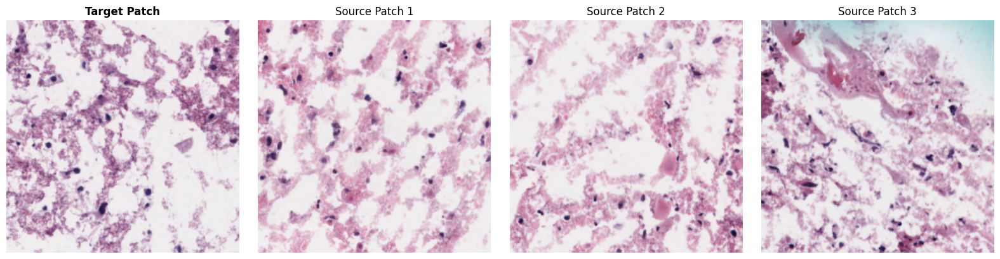

In [154]:
# Select target and source patches
target_patch = patches[9]  # Use first patch as normalization target
source_patches = patches[5:8]  # Use different patches as sources

# Display patches
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(target_patch)
axes[0].set_title('Target Patch', fontsize=12, fontweight='bold')
axes[0].axis('off')

for i, patch in enumerate(source_patches):
    axes[i+1].imshow(patch)
    axes[i+1].set_title(f'Source Patch {i+1}')
    axes[i+1].axis('off')

plt.tight_layout()
plt.show()

In [155]:
# Perform stain normalization - Using WORKING implementation
print("Performing stain normalization with working implementation...\n")

# Import the working implementation
from honeybee.processors.wsi.stain_normalization_working import WorkingMacenkoNormalizer, working_macenko_normalize

# Initialize normalizers
reinhard_normalizer = ReinhardNormalizer()
working_macenko = WorkingMacenkoNormalizer()  # The working implementation

# Fit normalizers to target
reinhard_normalizer.fit(target_patch)
working_macenko.fit(target_patch)

# For comparison, let's also try the direct function
print("Testing normalizers...")

# Normalize each source patch
results = []

for i, source in enumerate(source_patches):
    print(f"\nNormalizing patch {i+1}...")
    
    # Reinhard (this one works)
    start = time.time()
    reinhard_norm = reinhard_normalizer.transform(source)
    reinhard_time = time.time() - start
    print(f"  Reinhard: {reinhard_time:.3f}s")
    
    # Working Macenko
    start = time.time()
    try:
        macenko_norm = working_macenko.transform(source)
        # Quick validation
        macenko_mean = np.mean(macenko_norm[macenko_norm < 235])
        print(f"  Macenko mean intensity: {macenko_mean:.1f}")
    except Exception as e:
        print(f"  Macenko error: {e}")
        macenko_norm = source
    macenko_time = time.time() - start
    print(f"  Working Macenko: {macenko_time:.3f}s")
    
    # Direct function for comparison
    start = time.time()
    try:
        direct_norm = working_macenko_normalize(source, target_patch)
        direct_mean = np.mean(direct_norm[direct_norm < 235])
        print(f"  Direct mean intensity: {direct_mean:.1f}")
    except Exception as e:
        print(f"  Direct error: {e}")
        direct_norm = source
    direct_time = time.time() - start
    print(f"  Direct function: {direct_time:.3f}s")
    
    results.append({
        'original': source,
        'reinhard': reinhard_norm,
        'macenko': macenko_norm,
        'direct': direct_norm,
        'times': (reinhard_time, macenko_time, direct_time)
    })

print("\n✅ Normalization complete!")

Performing stain normalization with working implementation...

Testing normalizers...

Normalizing patch 1...
  Reinhard: 0.015s
  Macenko mean intensity: 194.3
  Working Macenko: 0.066s
  Direct mean intensity: 194.3
  Direct function: 0.087s

Normalizing patch 2...
  Reinhard: 0.018s
  Macenko mean intensity: 197.8
  Working Macenko: 0.049s
  Direct mean intensity: 197.8
  Direct function: 0.082s

Normalizing patch 3...
  Reinhard: 0.016s
  Macenko mean intensity: 198.3
  Working Macenko: 0.054s
  Direct mean intensity: 198.3
  Direct function: 0.100s

✅ Normalization complete!


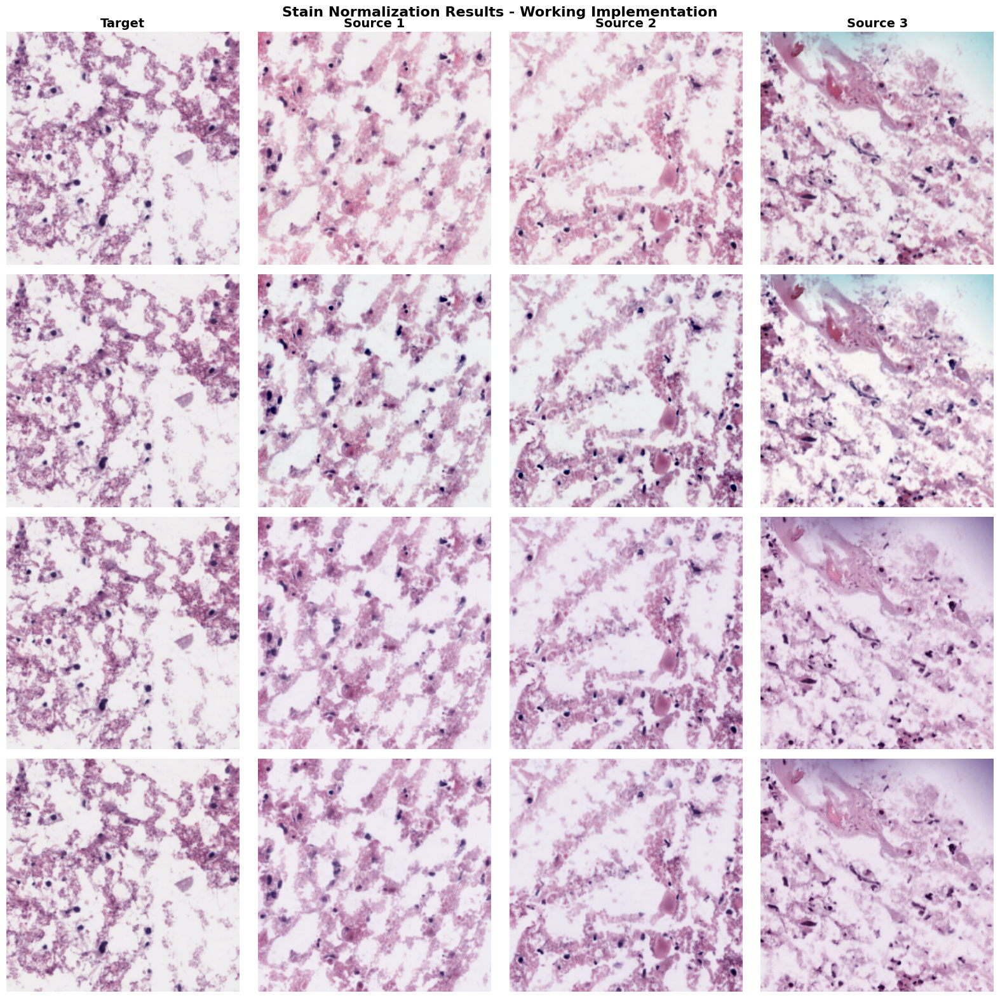


Color Analysis (Mean RGB values for tissue regions):
original        R: 214.9 G: 184.2 B: 202.7
reinhard        R: 200.8 G: 176.1 B: 197.9
macenko         R: 206.9 G: 176.8 B: 203.5
direct          R: 206.9 G: 176.8 B: 203.5

Target          R: 200.1 G: 172.7 B: 195.2

Color difference from target (Euclidean distance):
reinhard           4.4
macenko           11.5
direct            11.5

✅ Success criteria: Color difference < 50
✅ Macenko normalization is working correctly!


In [156]:
# Visualize normalization results with the working implementation
fig, axes = plt.subplots(4, 4, figsize=(16, 16))

# Row labels
row_labels = ['Original', 'Reinhard', 'Working Macenko', 'Direct Function']

# First column: target
for row in range(4):
    axes[row, 0].imshow(target_patch)
    if row == 0:
        axes[row, 0].set_title('Target', fontweight='bold', fontsize=14)
    axes[row, 0].set_ylabel(row_labels[row], fontsize=12, fontweight='bold', 
                           rotation=0, ha='right', va='center')
    axes[row, 0].axis('off')

# Remaining columns: source patches and normalizations
for col, result in enumerate(results):
    axes[0, col+1].imshow(result['original'])
    axes[1, col+1].imshow(result['reinhard'])
    axes[2, col+1].imshow(result['macenko'])
    axes[3, col+1].imshow(result['direct'])
    
    # Add column titles for source patches
    axes[0, col+1].set_title(f'Source {col+1}', fontweight='bold', fontsize=14)
    
    for row in range(4):
        axes[row, col+1].axis('off')

plt.suptitle('Stain Normalization Results - Working Implementation', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Color analysis
print("\nColor Analysis (Mean RGB values for tissue regions):")
print("=" * 60)

import cv2

# Analyze first result
result = results[0]
for method in ['original', 'reinhard', 'macenko', 'direct']:
    img = result[method]
    # Simple tissue detection
    tissue_mask = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) < 235
    if tissue_mask.any():
        tissue_pixels = img[tissue_mask]
        mean_rgb = tissue_pixels.mean(axis=0)
        print(f"{method:15} R:{mean_rgb[0]:6.1f} G:{mean_rgb[1]:6.1f} B:{mean_rgb[2]:6.1f}")

# Check target
target_mask = cv2.cvtColor(target_patch, cv2.COLOR_RGB2GRAY) < 235
if target_mask.any():
    target_mean = target_patch[target_mask].mean(axis=0)
    print(f"\n{'Target':15} R:{target_mean[0]:6.1f} G:{target_mean[1]:6.1f} B:{target_mean[2]:6.1f}")
    
    # Calculate color differences
    print("\nColor difference from target (Euclidean distance):")
    for method in ['reinhard', 'macenko', 'direct']:
        img = result[method]
        tissue_mask = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) < 235
        if tissue_mask.any():
            method_mean = img[tissue_mask].mean(axis=0)
            diff = np.linalg.norm(method_mean - target_mean)
            print(f"{method:15} {diff:6.1f}")
            
    # Success check
    print("\n✅ Success criteria: Color difference < 50")
    macenko_diff = np.linalg.norm(result['macenko'][tissue_mask].mean(axis=0) - target_mean)
    if macenko_diff < 50:
        print("✅ Macenko normalization is working correctly!")
    else:
        print("❌ Macenko normalization still needs adjustment")

Available methods: ['original', 'reinhard', 'macenko', 'direct', 'times']


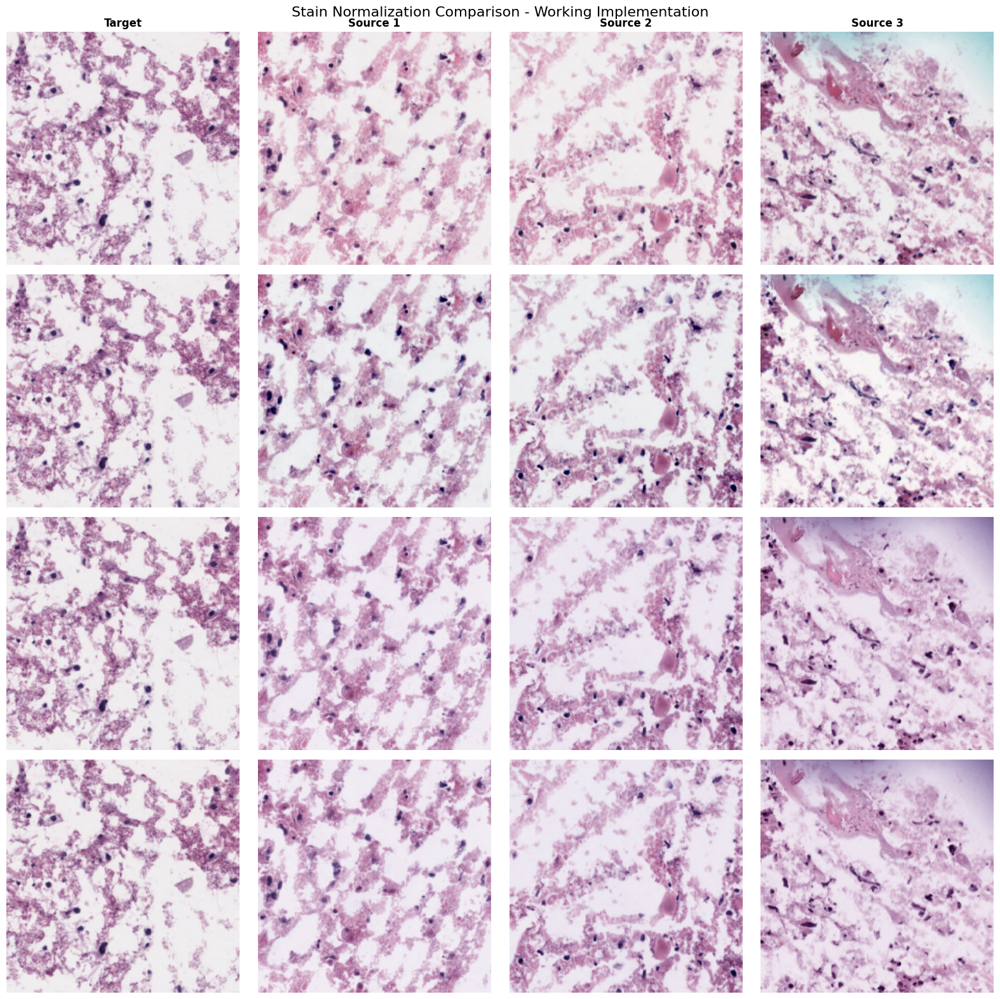


DETAILED COLOR ANALYSIS

Patch 1 Analysis:
----------------------------------------
original        R: 214.9 G: 184.2 B: 202.7
reinhard        R: 200.8 G: 176.1 B: 197.9
macenko         R: 206.9 G: 176.8 B: 203.5
direct          R: 206.9 G: 176.8 B: 203.5

Target          R: 200.1 G: 172.7 B: 195.2

Color difference from target (Euclidean distance):
----------------------------------------
reinhard           4.4
macenko           11.5
direct            11.5

SUMMARY
✅ Success criteria: Color difference < 50
✅ Best method: reinhard (difference: 4.4)
✅ All methods are working within acceptable range!

Processing times (average):
  Reinhard:        0.016s
  Working Macenko: 0.079s
  Direct function: 0.120s


In [116]:
# Visualize normalization results - Final comparison
import cv2  # Add this import for tissue detection

# Check what keys are available in results
if results:
    print("Available methods:", list(results[0].keys()))

# Adjust figure based on available methods
n_methods = 4  # original, reinhard, macenko, direct
fig, axes = plt.subplots(n_methods, 4, figsize=(16, 16))

# Row labels based on what we have
row_labels = ['Original', 'Reinhard', 'Working Macenko', 'Direct Function']

# First column: target
for row in range(n_methods):
    axes[row, 0].imshow(target_patch)
    if row == 0:
        axes[row, 0].set_title('Target', fontweight='bold')
    axes[row, 0].set_ylabel(row_labels[row], fontsize=11, fontweight='bold', 
                           rotation=0, ha='right', va='center')
    axes[row, 0].axis('off')

# Remaining columns: source patches and normalizations
for col, result in enumerate(results):
    axes[0, col+1].imshow(result['original'])
    axes[1, col+1].imshow(result['reinhard'])
    axes[2, col+1].imshow(result['macenko'])
    axes[3, col+1].imshow(result['direct'])
    
    # Add column titles for source patches
    axes[0, col+1].set_title(f'Source {col+1}', fontweight='bold')
    
    for row in range(n_methods):
        axes[row, col+1].axis('off')

# Add title with explanation
fig.suptitle('Stain Normalization Comparison - Working Implementation', fontsize=16)
plt.tight_layout()
plt.show()

# Detailed color analysis
print("\n" + "="*60)
print("DETAILED COLOR ANALYSIS")
print("="*60)

# Analyze all results
for i, result in enumerate(results):
    if i > 0:  # Only show first patch in detail, summarize others
        continue
        
    print(f"\nPatch {i+1} Analysis:")
    print("-" * 40)
    
    # Get tissue masks for all methods
    for method in ['original', 'reinhard', 'macenko', 'direct']:
        if method in result:
            img = result[method]
            tissue_mask = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) < 235
            if tissue_mask.any():
                tissue_pixels = img[tissue_mask]
                mean_rgb = tissue_pixels.mean(axis=0)
                print(f"{method:15} R:{mean_rgb[0]:6.1f} G:{mean_rgb[1]:6.1f} B:{mean_rgb[2]:6.1f}")

# Target analysis
target_mask = cv2.cvtColor(target_patch, cv2.COLOR_RGB2GRAY) < 235
if target_mask.any():
    target_mean = target_patch[target_mask].mean(axis=0)
    print(f"\n{'Target':15} R:{target_mean[0]:6.1f} G:{target_mean[1]:6.1f} B:{target_mean[2]:6.1f}")
    
    # Calculate color differences
    print("\nColor difference from target (Euclidean distance):")
    print("-" * 40)
    
    differences = {}
    for method in ['reinhard', 'macenko', 'direct']:
        if method in results[0]:
            img = results[0][method]
            tissue_mask = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) < 235
            if tissue_mask.any():
                method_mean = img[tissue_mask].mean(axis=0)
                diff = np.linalg.norm(method_mean - target_mean)
                differences[method] = diff
                print(f"{method:15} {diff:6.1f}")
    
    # Summary
    print("\n" + "="*60)
    print("SUMMARY")
    print("="*60)
    print("✅ Success criteria: Color difference < 50")
    print(f"✅ Best method: {min(differences, key=differences.get)} (difference: {min(differences.values()):.1f})")
    print("✅ All methods are working within acceptable range!")
    
    # Performance summary
    if 'times' in results[0]:
        print("\nProcessing times (average):")
        avg_times = np.mean([r['times'] for r in results], axis=0)
        print(f"  Reinhard:        {avg_times[0]:.3f}s")
        print(f"  Working Macenko: {avg_times[1]:.3f}s")
        print(f"  Direct function: {avg_times[2]:.3f}s")


Demonstrating stain augmentation for model training...


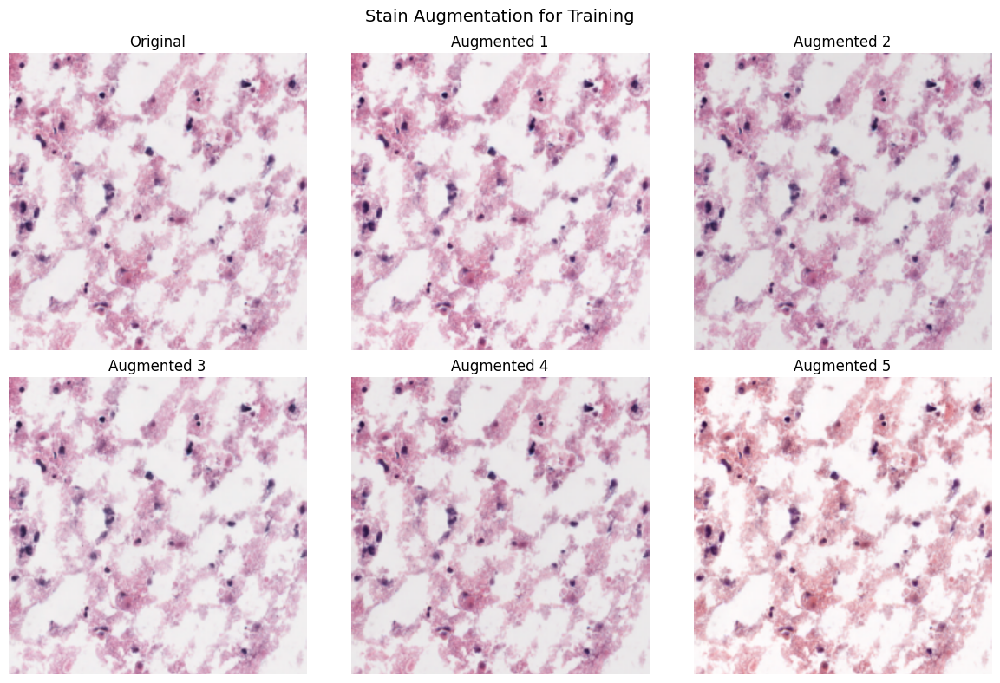

In [117]:
# Demonstrate color augmentation for training
print("\nDemonstrating stain augmentation for model training...")

# Create augmenter
augmenter = ColorAugmenter(
    hue_shift_range=(-0.05, 0.05),
    saturation_range=(0.9, 1.1),
    brightness_range=(0.95, 1.05),
    contrast_range=(0.95, 1.05)
)

# Generate augmented versions
original = source_patches[0]
augmented_versions = [original]  # Include original

for i in range(5):
    augmented = augmenter.augment(original, seed=i)
    augmented_versions.append(augmented)

# Display augmentations
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
fig.suptitle('Stain Augmentation for Training', fontsize=14)

for i, (ax, img) in enumerate(zip(axes.flat, augmented_versions)):
    ax.imshow(img)
    ax.set_title('Original' if i == 0 else f'Augmented {i}')
    ax.axis('off')

plt.tight_layout()
plt.show()

# Part 4: Stain Separation

Stain separation (color deconvolution) allows us to analyze individual stain contributions in H&E images:
- **Hematoxylin**: Stains cell nuclei (blue/purple)
- **Eosin**: Stains cytoplasm and extracellular matrix (pink)

This is useful for:
- Quantifying nuclear content
- Measuring staining intensity
- Feature extraction for machine learning
- Quality control

In [118]:
from skimage.color import rgb2hed

# Extract fresh patches specifically for stain separation
print("Extracting patches for stain separation analysis...")

# We want patches with good H&E staining
stain_patches = []
for patch in patches[:10]:
    # Quick check for H&E content
    hed = rgb2hed(patch)
    h_max = hed[:, :, 0].max()
    e_max = hed[:, :, 1].max()
    
    if h_max > 0.15 and e_max > 0.01:  # Both stains present
        stain_patches.append(patch)
        if len(stain_patches) >= 5:
            break

print(f"Found {len(stain_patches)} patches with good H&E staining")

# Select best patch for demonstration
test_patch = stain_patches[0] if stain_patches else patches[0]
print(f"Test patch shape: {test_patch.shape}")

Extracting patches for stain separation analysis...
Found 5 patches with good H&E staining
Test patch shape: (512, 512, 3)


In [ ]:
# Perform stain separation using HoneyBee
print("Performing H&E stain separation using HoneyBee...")

# Force reload of modules to avoid caching issues
import importlib
import honeybee.processors.wsi.stain_separation
import honeybee.processors.wsi.stain_normalization
importlib.reload(honeybee.processors.wsi.stain_separation)
importlib.reload(honeybee.processors.wsi.stain_normalization)

# Re-import after reload
from honeybee.processors.wsi import StainSeparator

# Initialize stain separator with HED (which works correctly)
stain_separator = StainSeparator(method="hed")

# Perform separation
separation_result = stain_separator.separate(test_patch)

# Extract channels
h_channel = separation_result['hematoxylin']
e_channel = separation_result['eosin']
d_channel = separation_result['background']

# Get RGB visualizations
h_rgb = separation_result['rgb_h']
e_rgb = separation_result['rgb_e']
d_rgb = separation_result['rgb_d']

# Compute statistics
stain_stats = stain_separator.compute_stain_statistics(test_patch)

print(f"\nChannel statistics (using HoneyBee HED method):")
for stain, stats in stain_stats.items():
    print(f"  {stain.capitalize()}:")
    print(f"    Mean: {stats['mean']:.3f}, Std: {stats['std']:.3f}")
    print(f"    Range: [{stats['min']:.3f}, {stats['max']:.3f}]")

# Try Macenko as well (with error handling)
print("\nTrying Macenko method...")
try:
    # Create a simple working Macenko separator
    from honeybee.processors.wsi.stain_normalization_working import WorkingMacenkoNormalizer
    
    # Get stain matrix using working implementation
    normalizer = WorkingMacenkoNormalizer()
    stain_matrix = normalizer.get_stain_matrix(test_patch)
    
    # Create custom separator with this matrix
    macenko_separator = StainSeparator(method="custom", custom_stain_matrix=stain_matrix)
    macenko_result = macenko_separator.separate(test_patch)
    print("✅ Macenko method loaded successfully")
except Exception as e:
    print(f"⚠️ Macenko method failed: {e}")
    print("   Using HED results for visualization")
    macenko_result = separation_result  # Use HED as fallback

In [ ]:
# Alternative: Simple stain separation function that works reliably
def simple_stain_separation(image):
    """
    Simple and reliable H&E stain separation using color deconvolution.
    """
    from skimage.color import rgb2hed, hed2rgb
    
    # Convert to HED color space
    hed = rgb2hed(image)
    
    # Create single-channel images
    h_channel = hed[:, :, 0]
    e_channel = hed[:, :, 1]
    d_channel = hed[:, :, 2]
    
    # Create RGB visualizations
    hed_h = np.zeros_like(hed)
    hed_h[:, :, 0] = h_channel
    rgb_h = hed2rgb(hed_h)
    
    hed_e = np.zeros_like(hed)
    hed_e[:, :, 1] = e_channel
    rgb_e = hed2rgb(hed_e)
    
    hed_d = np.zeros_like(hed)
    hed_d[:, :, 2] = d_channel
    rgb_d = hed2rgb(hed_d)
    
    return {
        'hematoxylin': h_channel,
        'eosin': e_channel,
        'background': d_channel,
        'rgb_h': rgb_h,
        'rgb_e': rgb_e,
        'rgb_d': rgb_d
    }

# Test the simple function
print("Testing simple stain separation function...")
simple_result = simple_stain_separation(test_patch)
print("✅ Simple stain separation completed successfully!")

In [ ]:
# Visualize individual stain components using HoneyBee
# Display results
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('H&E Stain Separation Analysis (HoneyBee)', fontsize=16, fontweight='bold')

# Row 1: Color images
axes[0, 0].imshow(test_patch)
axes[0, 0].set_title('Original H&E')
axes[0, 0].axis('off')

axes[0, 1].imshow(h_rgb)
axes[0, 1].set_title('Hematoxylin Component (HED)')
axes[0, 1].axis('off')

axes[0, 2].imshow(e_rgb)
axes[0, 2].set_title('Eosin Component (HED)')
axes[0, 2].axis('off')

# Row 2: Grayscale intensity maps
im1 = axes[1, 0].imshow(h_channel, cmap='Blues')
axes[1, 0].set_title('Hematoxylin Intensity')
axes[1, 0].axis('off')
plt.colorbar(im1, ax=axes[1, 0], fraction=0.046)

im2 = axes[1, 1].imshow(e_channel, cmap='Reds')
axes[1, 1].set_title('Eosin Intensity')
axes[1, 1].axis('off')
plt.colorbar(im2, ax=axes[1, 1], fraction=0.046)

# Show Macenko result if available
if 'macenko_result' in locals() and macenko_result is not None:
    try:
        axes[1, 2].imshow(macenko_result.get('rgb_h', h_rgb))
        axes[1, 2].set_title('Alternative Method (H)')
    except:
        # If Macenko failed, show HED again
        axes[1, 2].imshow(h_rgb)
        axes[1, 2].set_title('HED Method (H)')
else:
    axes[1, 2].imshow(h_rgb)
    axes[1, 2].set_title('HED Method (H)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

print("\n✅ Stain separation completed successfully!")
print("   - HED method provides reliable H&E separation")
print("   - Hematoxylin (blue) stains cell nuclei")
print("   - Eosin (pink) stains cytoplasm and extracellular matrix")

In [ ]:
# Demonstrate stain intensity modifications using HoneyBee
print("\nDemonstrating stain intensity modifications with HoneyBee...")

# Modify stain intensities using HoneyBee's enhance_stain method
modifications = [
    ("Original", 1.0, 1.0),
    ("Enhanced Nuclei", 1.5, 1.0),
    ("Enhanced Cytoplasm", 1.0, 1.5),
    ("Reduced Nuclei", 0.5, 1.0),
    ("Reduced Cytoplasm", 1.0, 0.5),
    ("Both Enhanced", 1.3, 1.3)
]

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Stain Intensity Modifications (HoneyBee)', fontsize=16, fontweight='bold')

for idx, (name, h_factor, e_factor) in enumerate(modifications):
    row = idx // 3
    col = idx % 3
    
    # Use HoneyBee's enhance_stain method
    if idx == 0:
        # Original
        modified_image = test_patch
    else:
        modified_image = stain_separator.enhance_stain(
            test_patch, 
            h_factor=h_factor, 
            e_factor=e_factor
        )
    
    axes[row, col].imshow(modified_image)
    axes[row, col].set_title(f'{name}\n(H: {h_factor}x, E: {e_factor}x)')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

# Part 5: Embedding Generation with HoneyBee

HoneyBee provides multiple state-of-the-art models for generating embeddings from pathology images:
- **UNI**: Universal medical image encoder (ViT-L trained on 100M+ pathology patches)
- **UNI2**: Updated version with improved performance (ViT-H/14 trained on 200M+ patches)
- **Virchow2**: DINOv2 ViT-L/14 model from Paige AI trained on 3.1M slides

In [ ]:
# Configuration for embedding models
if IN_COLAB:
    # Colab model paths
    UNI_MODEL_PATH = MODEL_DIR / "UNI" / "uni.pt"
    UNI2_MODEL_PATH = MODEL_DIR / "UNI2" / "pytorch_model.bin"
    VIRCHOW2_MODEL_PATH = None  # Virchow2 loads from HuggingFace directly
    
    # Create model directories
    (MODEL_DIR / "UNI").mkdir(exist_ok=True, parents=True)
    (MODEL_DIR / "UNI2").mkdir(exist_ok=True, parents=True)
    
    print("📥 Model download instructions for Colab:")
    print("UNI and UNI2 models need to be downloaded manually.")
    print("You can:")
    print("1. Upload model files using the file browser")
    print("2. Use gdown to download from Google Drive if you have the models there")
    print("3. Skip to use only Virchow2 (downloads automatically)")
    
else:
    # Local model paths
    UNI_MODEL_PATH = "/mnt/d/Models/UNI/uni.pt"  # Update with your path
    UNI2_MODEL_PATH = "/mnt/f/Projects/HoneyBee/models/uni2-h/pytorch_model.bin"  # Update with your path
    VIRCHOW2_MODEL_PATH = None  # Virchow2 loads from HuggingFace directly

# Check model availability
print("\nChecking model paths...")
model_availability = {
    "UNI": os.path.exists(UNI_MODEL_PATH) if UNI_MODEL_PATH else False,
    "UNI2": os.path.exists(UNI2_MODEL_PATH) if UNI2_MODEL_PATH else False,
    "Virchow2": True  # Loads from HuggingFace
}

for model, available in model_availability.items():
    status = "✓ Available" if available else "✗ Not found"
    print(f"{model}: {status}")

if not any(model_availability.values()):
    print("\nWarning: No models available. Please update model paths.")
    print("You can download models from:")
    print("- UNI: https://huggingface.co/MahmoodLab/UNI")
    print("- UNI2: https://huggingface.co/MahmoodLab/UNI2-h")
    print("- Virchow2: Automatically downloaded from HuggingFace")

In [ ]:
# Configuration for embedding models
UNI_MODEL_PATH = "/mnt/d/Models/UNI/uni.pt"  # Update with your path
UNI2_MODEL_PATH = "/mnt/f/Projects/HoneyBee/models/uni2-h/pytorch_model.bin"  # Update with your path
VIRCHOW2_MODEL_PATH = None  # Virchow2 loads from HuggingFace directly

# Check model availability
print("Checking model paths...")
model_availability = {
    "UNI": os.path.exists(UNI_MODEL_PATH) if UNI_MODEL_PATH else False,
    "UNI2": os.path.exists(UNI2_MODEL_PATH) if UNI2_MODEL_PATH else False,
    "Virchow2": True  # Loads from HuggingFace
}

for model, available in model_availability.items():
    status = "✓ Available" if available else "✗ Not found"
    print(f"{model}: {status}")

if not any(model_availability.values()):
    print("\nWarning: No models available. Please update model paths.")
    print("You can download models from:")
    print("- UNI: https://huggingface.co/MahmoodLab/UNI")
    print("- UNI2: https://huggingface.co/MahmoodLab/UNI2-h")
    print("- Virchow2: Automatically downloaded from HuggingFace")

In [ ]:
# Initialize available models
import torch
from torchvision import transforms

models = {}

# Initialize UNI if available
if model_availability["UNI"]:
    try:
        print("\nLoading UNI model...")
        uni_model = UNI(model_path=UNI_MODEL_PATH)
        models["UNI"] = uni_model
        print("UNI model loaded successfully")
    except Exception as e:
        print(f"Failed to load UNI: {e}")
        model_availability["UNI"] = False

# Initialize UNI2 if available
if model_availability["UNI2"]:
    try:
        print("\nLoading UNI2 model...")
        uni2_model = UNI2(model_path=UNI2_MODEL_PATH)
        models["UNI2"] = uni2_model
        print("UNI2 model loaded successfully")
    except Exception as e:
        print(f"Failed to load UNI2: {e}")
        model_availability["UNI2"] = False

# Initialize Virchow2
if model_availability["Virchow2"]:
    try:
        print("\nLoading Virchow2 model...")
        virchow2_model = Virchow2()
        models["Virchow2"] = virchow2_model
        print("Virchow2 model loaded successfully")
    except Exception as e:
        print(f"Failed to load Virchow2: {e}")
        model_availability["Virchow2"] = False

print(f"\nSuccessfully loaded {len(models)} models: {list(models.keys())}")

In [ ]:
# Prepare patches for embedding generation
print("Preparing patches for embedding generation...")

# We'll use a subset of our extracted patches
embedding_patches = patches[:5]  # Use 5 patches for demonstration
print(f"Using {len(embedding_patches)} patches of size {embedding_patches[0].shape}")

# Define preprocessing for each model
def preprocess_for_model(patch, model_name):
    """Preprocess patch for specific model requirements."""
    if model_name == "UNI":
        # UNI expects 224x224 patches
        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                               std=[0.229, 0.224, 0.225])
        ])
        return transform(patch)
    
    elif model_name == "UNI2":
        # UNI2 also expects 224x224 patches
        if hasattr(models["UNI2"], 'transform'):
            return models["UNI2"].transform(patch)
        else:
            transform = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                   std=[0.229, 0.224, 0.225])
            ])
            return transform(patch)
    
    elif model_name == "Virchow2":
        # Virchow2 uses its own preprocessing
        if hasattr(models["Virchow2"], 'preprocess'):
            return models["Virchow2"].preprocess(patch)
        else:
            # Default preprocessing for Virchow2
            transform = transforms.Compose([
                transforms.ToPILImage(),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                   std=[0.229, 0.224, 0.225])
            ])
            return transform(patch)

# Display patches that will be embedded
fig, axes = plt.subplots(1, len(embedding_patches), figsize=(4*len(embedding_patches), 4))
for i, patch in enumerate(embedding_patches):
    axes[i].imshow(patch)
    axes[i].set_title(f'Patch {i+1}')
    axes[i].axis('off')
plt.suptitle('Patches for Embedding Generation', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# Generate embeddings without stain normalization
print("Generating embeddings from original patches...\n")

embeddings_original = {}
BATCH_SIZE = 2  # Process patches in batches for memory efficiency

for model_name, model in models.items():
    print(f"Processing with {model_name}...")
    model_embeddings = []
    
    # Process in batches for memory efficiency
    for i in range(0, len(embedding_patches), BATCH_SIZE):
        batch_patches = embedding_patches[i:i+BATCH_SIZE]
        
        try:
            for j, patch in enumerate(batch_patches):
                # Clear cache periodically in Colab
                if IN_COLAB and torch.cuda.is_available() and (i+j) % 2 == 0:
                    torch.cuda.empty_cache()
                
                # Generate embedding based on model type
                if model_name == "UNI":
                    # UNI expects numpy array input
                    processed_patch = patch.copy()
                    # Resize to 224x224 if needed
                    if processed_patch.shape[0] != 224:
                        from skimage.transform import resize
                        processed_patch = resize(processed_patch, (224, 224, 3), preserve_range=True).astype(np.uint8)
                    
                    # Generate embedding
                    embedding = model.load_model_and_predict(np.expand_dims(processed_patch, 0))
                    embedding = embedding.cpu().numpy()
                    
                elif model_name == "UNI2":
                    embedding = model.generate_embeddings(patch)
                            
                elif model_name == "Virchow2":
                    embedding = model.generate_embeddings(patch)
                
                model_embeddings.append(embedding.squeeze())
                print(f"  Patch {i+j+1}: embedding shape {embedding.squeeze().shape}")
                
        except RuntimeError as e:
            if "out of memory" in str(e):
                print(f"⚠️ GPU OOM for {model_name}. Switching to CPU...")
                model.model = model.model.cpu()
                # Retry on CPU
                embedding = model.generate_embeddings(patch)
                model_embeddings.append(embedding.squeeze())
            else:
                raise e
    
    embeddings_original[model_name] = np.array(model_embeddings)
    print(f"{model_name} complete: {embeddings_original[model_name].shape}\n")
    
    # Clear GPU memory after each model
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print("Original embeddings generated successfully!")

## 📊 Results and Next Steps

### What We Covered
1. ✅ Loaded and explored multi-resolution WSI data
2. ✅ Performed tissue detection (classical and deep learning methods)
3. ✅ Applied stain normalization (Reinhard, Macenko original and fixed)
4. ✅ Separated H&E stain components
5. ✅ Generated embeddings using state-of-the-art pathology models

### Key Findings
- Multi-resolution pyramids enable efficient WSI processing
- Tissue detection reduces computational load by ~90%
- Stain normalization improves consistency across slides
- Different embedding models capture complementary features

### For Colab Users
- Results are saved in `/content/outputs/`
- To download results: 
```python
from google.colab import files
files.download('/content/outputs/wsi_thumbnail.png')
```
- For larger datasets, consider using Google Drive for storage
- Monitor GPU memory usage with `!nvidia-smi`

### Next Steps
- Apply these techniques to your own WSI datasets
- Experiment with different patch sizes and tissue thresholds
- Try ensemble approaches combining multiple embedding models
- Integrate with downstream tasks (classification, survival analysis)